In [1]:
import numpy as np 
import os
import skimage.io as io
from skimage import img_as_ubyte
import skimage.transform as trans
import numpy as np
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import glob
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.python.framework.config import set_memory_growth


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0],
       [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=3096)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:

def unet(pretrained_weights = None,input_size = (256,256,3)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    UpSampling2D(size=(2, 2))(drop5))
    merge6 = concatenate([drop4, up6],axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
    up7 = Conv2D(256, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    UpSampling2D(size=(2, 2))(conv6))
    merge7 = concatenate([conv3, up7],axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
    up8 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    UpSampling2D(size=(2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
    up9 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    UpSampling2D(size=(2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)
    model = Model(inputs=inputs, outputs=conv10)

    model.compile(optimizer=Adam(learning_rate=0.00001), loss='binary_crossentropy', metrics=['accuracy'])

    if(pretrained_weights):
    	model.load_weights(pretrained_weights)

    return model


In [4]:
import numpy as np
TRAIN_PATH = "./dataset/train/images/"
MASK_PATH = "./dataset/train/masks/"

def process_data(img_data, img_label):
    img_datas = img_data.astype('float32')
    img_masks = img_label.astype('float32')
    img_datas /= 255
    img_masks /= 255
    img_masks[img_masks > 0.5] = 1
    img_masks[img_masks <= 0.5] = 0
    return (img_datas, img_masks)

def create_train_data():
    img_datagen = ImageDataGenerator(
        rotation_range=20, 
        horizontal_flip = True
    )
    
    img_data_generator = img_datagen.flow_from_directory(
        directory = "./dataset/train/",
        classes = ['images'],
        class_mode = None,
        color_mode = 'rgb',
        batch_size=2, # specify the no. of images you want to load at a time
        target_size=(256, 256),
        seed = 1
    )
    mask_datagen = ImageDataGenerator(
        rotation_range=20, 
        horizontal_flip = True
    )
    
    mask_data_generator = mask_datagen.flow_from_directory(
        directory = "./dataset/train/",
        classes = ['masks'],
        class_mode = None,
        color_mode = 'grayscale',
        batch_size=2, # specify the no. of images you want to load at a time
        target_size=(256, 256),
        seed = 1
    )

    train_data = zip(img_data_generator, mask_data_generator)
    for(img, mask) in train_data:
        image, label = process_data(img, mask)
        yield (image, label)



In [5]:
TEST_PATH = "./dataset/test/images"


def create_test_data():
    imgs = glob.glob(TEST_PATH + "/*.png")
    img_datas = np.ndarray((len(imgs), self.out_rows, self.out_cols, 3), dtype=np.uint8)
    for x in range(len(imgs)):
        imgpath = imgs[x]
        img = load_img(imgpath, grayscale=False, target_size=[512, 512])
        img = img_to_array(img)
        img_datas[x] = img
    return img_datas

<generator object create_train_data at 0x000001D340C59040>
Found 3220 images belonging to 1 classes.
Found 3220 images belonging to 1 classes.
(256, 256, 3)


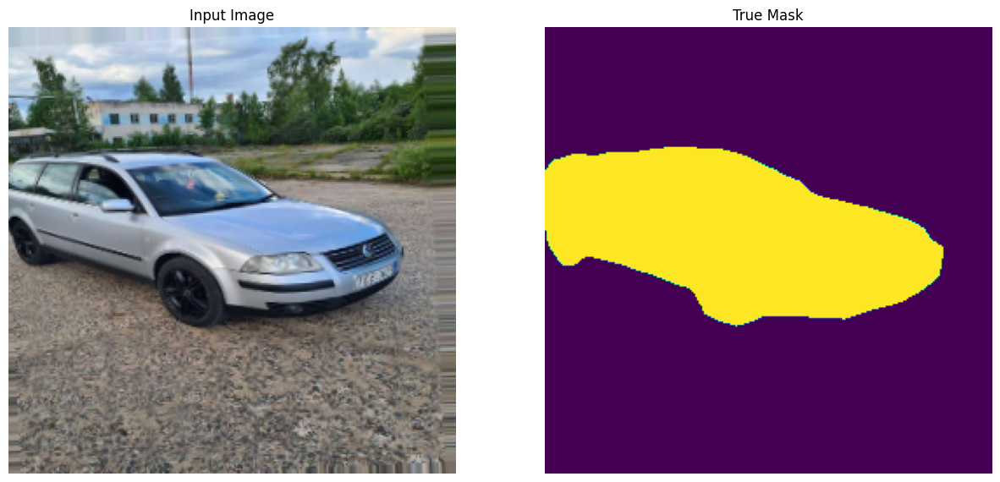

In [18]:
print(create_train_data())
train_data = create_train_data()
(sample_image ,sample_mask) = next(train_data)
sample_image = sample_image[0]
sample_mask = sample_mask[0]
print(sample_image.shape)
def display(display_list):
  plt.figure(figsize=(15, 15))
  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

display([sample_image, sample_mask])

def create_mask(pred_mask):
  return pred_mask[0]

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])


In [19]:
SAVE_PATH = "./dataset/test/maks/"
def save_images(pred_array):
    for i in range(pred_array.shape[0]):
        img = pred_array[i]
        img = array_to_img(img)
        img.save(SAVE_PATH + "{0}.png".format(i))

1/1 [==============================] - 0s 287ms/step


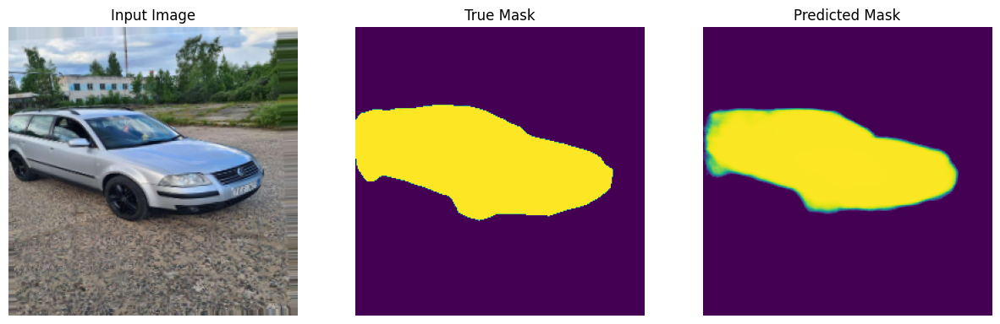

In [58]:

show_predictions()

In [10]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Starting to fit UNET model..
Epoch 1/50
100/100 [==============================] - ETA: 0s - loss: 0.6654 - accuracy: 0.7101
Epoch 1: loss improved from inf to 0.66535, saving model to unet_car.hdf5
1/1 [==============================] - 0s 25ms/step


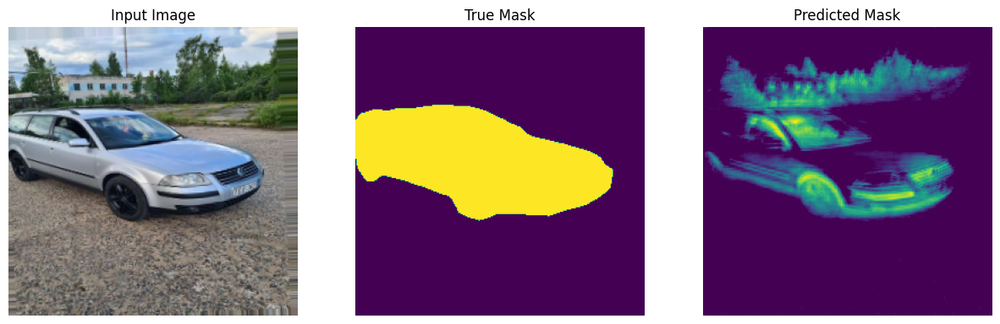


Sample Prediction after epoch 1

100/100 [==============================] - 49s 374ms/step - loss: 0.6654 - accuracy: 0.7101
Epoch 2/50
100/100 [==============================] - ETA: 0s - loss: 0.6000 - accuracy: 0.8308
Epoch 2: loss improved from 0.66535 to 0.60003, saving model to unet_car.hdf5
1/1 [==============================] - 0s 25ms/step


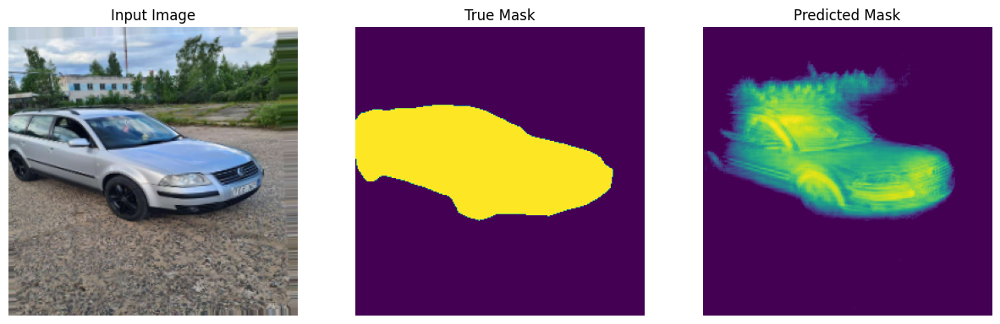


Sample Prediction after epoch 2

100/100 [==============================] - 39s 394ms/step - loss: 0.6000 - accuracy: 0.8308
Epoch 3/50
100/100 [==============================] - ETA: 0s - loss: 0.5795 - accuracy: 0.8641
Epoch 3: loss improved from 0.60003 to 0.57947, saving model to unet_car.hdf5
1/1 [==============================] - 0s 28ms/step


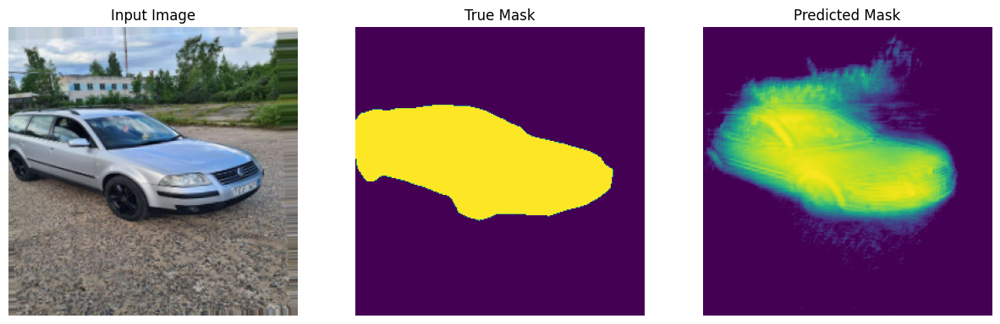


Sample Prediction after epoch 3

100/100 [==============================] - 43s 430ms/step - loss: 0.5795 - accuracy: 0.8641
Epoch 4/50
100/100 [==============================] - ETA: 0s - loss: 0.5654 - accuracy: 0.8836
Epoch 4: loss improved from 0.57947 to 0.56537, saving model to unet_car.hdf5
1/1 [==============================] - 0s 28ms/step


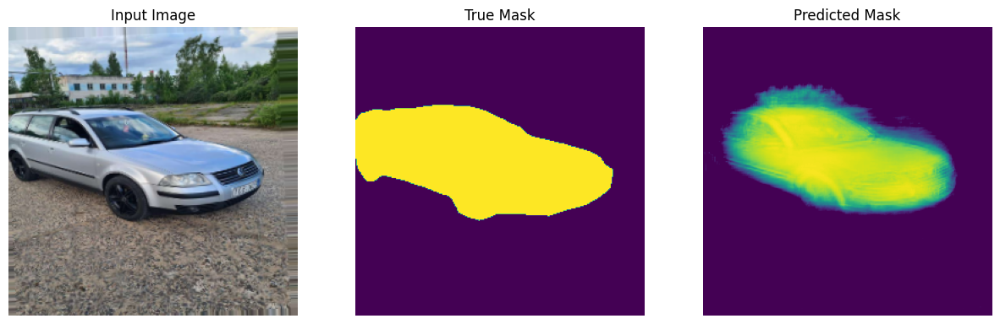


Sample Prediction after epoch 4

100/100 [==============================] - 46s 461ms/step - loss: 0.5654 - accuracy: 0.8836
Epoch 5/50
100/100 [==============================] - ETA: 0s - loss: 0.5732 - accuracy: 0.8819
Epoch 5: loss did not improve from 0.56537
1/1 [==============================] - 0s 32ms/step


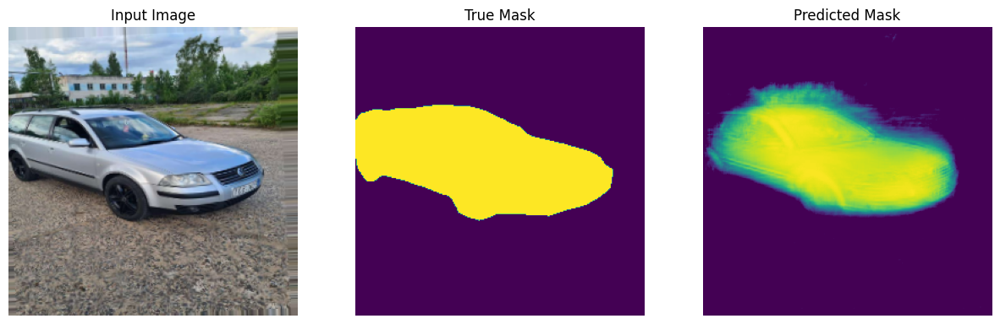


Sample Prediction after epoch 5

100/100 [==============================] - 43s 433ms/step - loss: 0.5732 - accuracy: 0.8819
Epoch 6/50
100/100 [==============================] - ETA: 0s - loss: 0.5597 - accuracy: 0.8838
Epoch 6: loss improved from 0.56537 to 0.55967, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


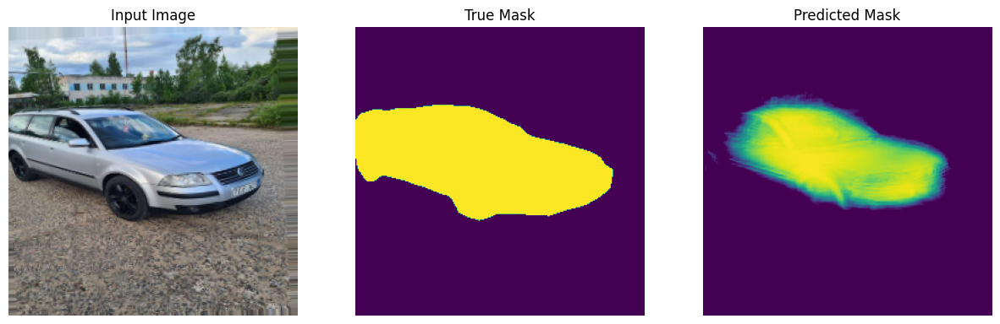


Sample Prediction after epoch 6

100/100 [==============================] - 52s 522ms/step - loss: 0.5597 - accuracy: 0.8838
Epoch 7/50
100/100 [==============================] - ETA: 0s - loss: 0.5454 - accuracy: 0.8955
Epoch 7: loss improved from 0.55967 to 0.54539, saving model to unet_car.hdf5
1/1 [==============================] - 0s 33ms/step


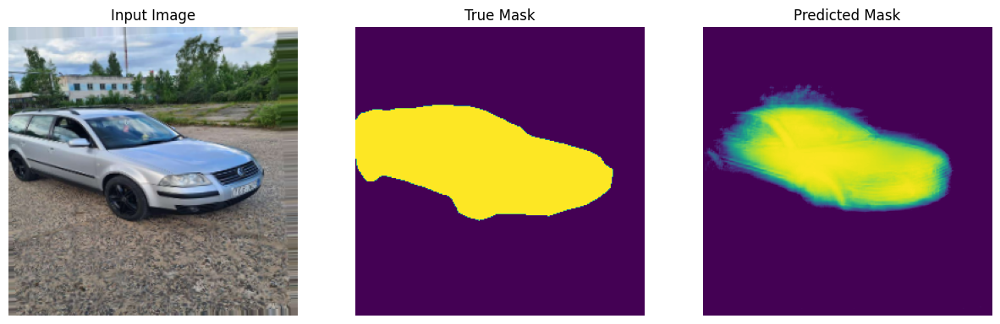


Sample Prediction after epoch 7

100/100 [==============================] - 53s 532ms/step - loss: 0.5454 - accuracy: 0.8955
Epoch 8/50
100/100 [==============================] - ETA: 0s - loss: 0.5322 - accuracy: 0.8986
Epoch 8: loss improved from 0.54539 to 0.53215, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


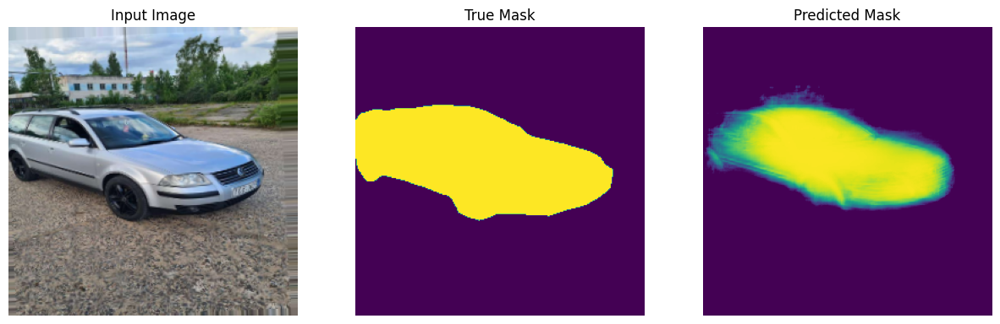


Sample Prediction after epoch 8

100/100 [==============================] - 56s 559ms/step - loss: 0.5322 - accuracy: 0.8986
Epoch 9/50
100/100 [==============================] - ETA: 0s - loss: 0.5364 - accuracy: 0.8926
Epoch 9: loss did not improve from 0.53215
1/1 [==============================] - 0s 33ms/step


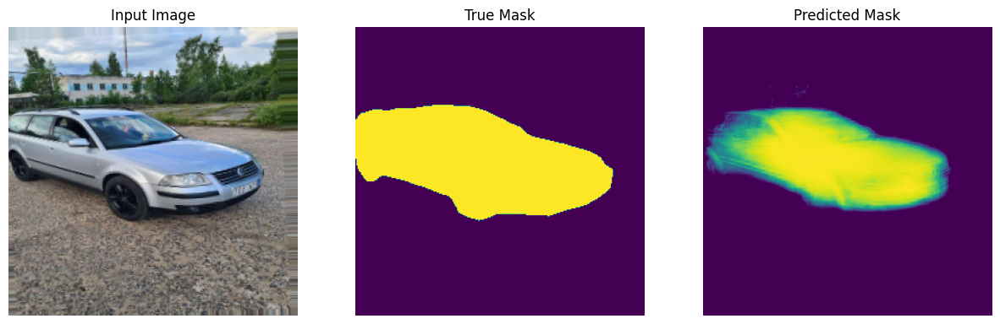


Sample Prediction after epoch 9

100/100 [==============================] - 50s 501ms/step - loss: 0.5364 - accuracy: 0.8926
Epoch 10/50
100/100 [==============================] - ETA: 0s - loss: 0.5206 - accuracy: 0.9075
Epoch 10: loss improved from 0.53215 to 0.52064, saving model to unet_car.hdf5
1/1 [==============================] - 0s 29ms/step


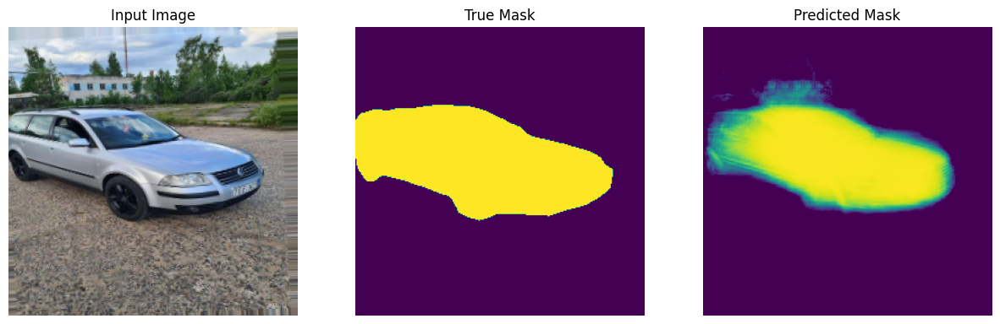


Sample Prediction after epoch 10

100/100 [==============================] - 56s 566ms/step - loss: 0.5206 - accuracy: 0.9075
Epoch 11/50
100/100 [==============================] - ETA: 0s - loss: 0.5205 - accuracy: 0.9145
Epoch 11: loss improved from 0.52064 to 0.52054, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


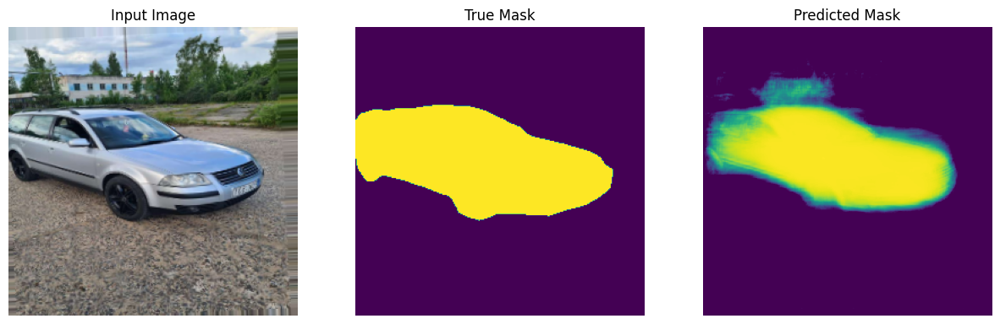


Sample Prediction after epoch 11

100/100 [==============================] - 53s 530ms/step - loss: 0.5205 - accuracy: 0.9145
Epoch 12/50
100/100 [==============================] - ETA: 0s - loss: 0.5206 - accuracy: 0.9171
Epoch 12: loss did not improve from 0.52054
1/1 [==============================] - 0s 30ms/step


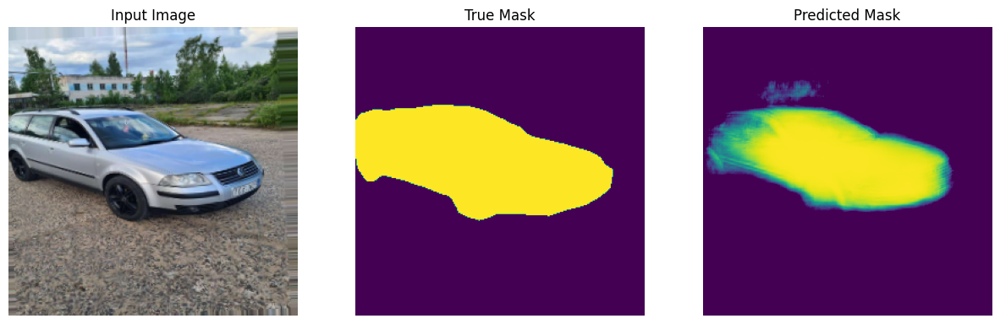


Sample Prediction after epoch 12

100/100 [==============================] - 51s 510ms/step - loss: 0.5206 - accuracy: 0.9171
Epoch 13/50
100/100 [==============================] - ETA: 0s - loss: 0.5251 - accuracy: 0.9146
Epoch 13: loss did not improve from 0.52054
1/1 [==============================] - 0s 30ms/step


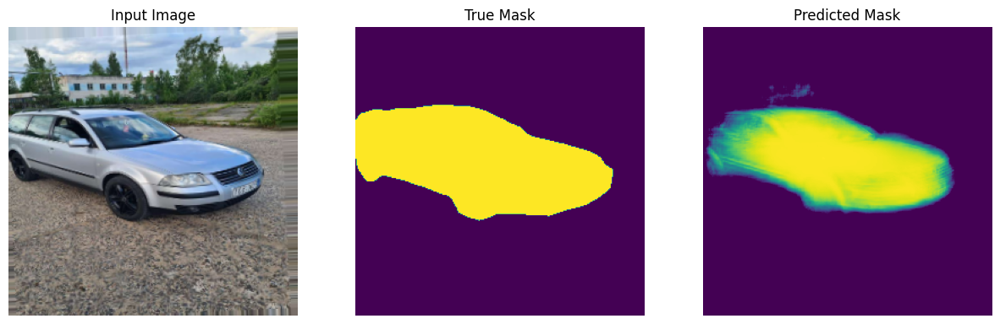


Sample Prediction after epoch 13

100/100 [==============================] - 54s 537ms/step - loss: 0.5251 - accuracy: 0.9146
Epoch 14/50
100/100 [==============================] - ETA: 0s - loss: 0.5217 - accuracy: 0.9177
Epoch 14: loss did not improve from 0.52054
1/1 [==============================] - 0s 34ms/step


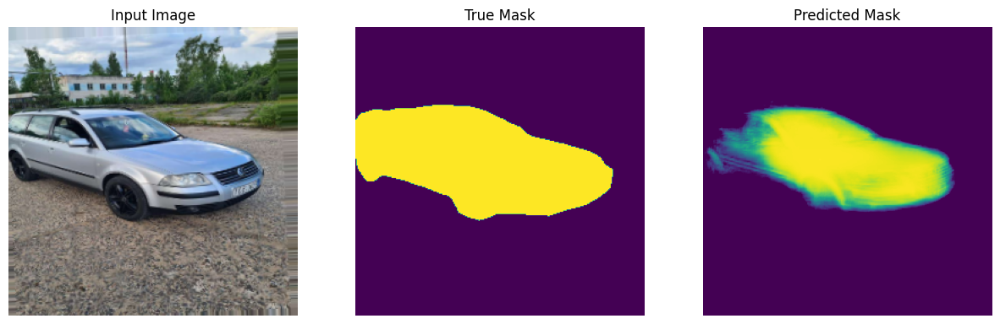


Sample Prediction after epoch 14

100/100 [==============================] - 52s 522ms/step - loss: 0.5217 - accuracy: 0.9177
Epoch 15/50
100/100 [==============================] - ETA: 0s - loss: 0.5231 - accuracy: 0.9179
Epoch 15: loss did not improve from 0.52054
1/1 [==============================] - 0s 30ms/step


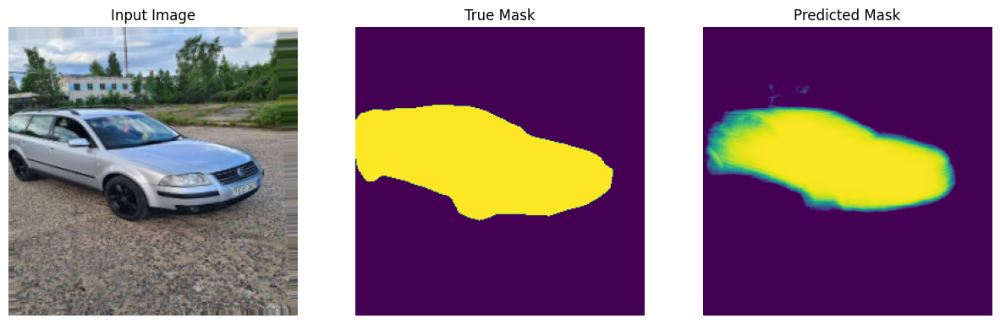


Sample Prediction after epoch 15

100/100 [==============================] - 55s 545ms/step - loss: 0.5231 - accuracy: 0.9179
Epoch 16/50
100/100 [==============================] - ETA: 0s - loss: 0.5132 - accuracy: 0.9294
Epoch 16: loss improved from 0.52054 to 0.51324, saving model to unet_car.hdf5
1/1 [==============================] - 0s 32ms/step


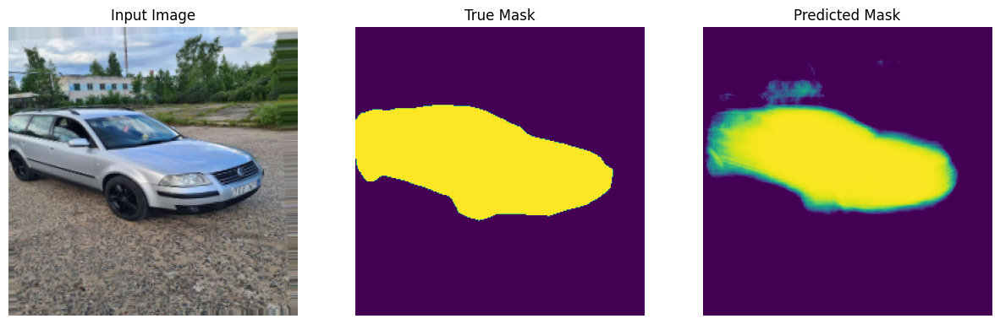


Sample Prediction after epoch 16

100/100 [==============================] - 60s 603ms/step - loss: 0.5132 - accuracy: 0.9294
Epoch 17/50
100/100 [==============================] - ETA: 0s - loss: 0.5033 - accuracy: 0.9214
Epoch 17: loss improved from 0.51324 to 0.50334, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


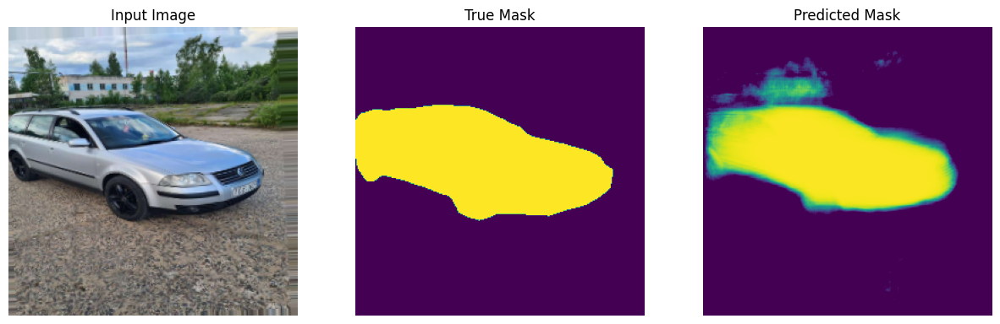


Sample Prediction after epoch 17

100/100 [==============================] - 56s 567ms/step - loss: 0.5033 - accuracy: 0.9214
Epoch 18/50
100/100 [==============================] - ETA: 0s - loss: 0.5043 - accuracy: 0.9347
Epoch 18: loss did not improve from 0.50334
1/1 [==============================] - 0s 38ms/step


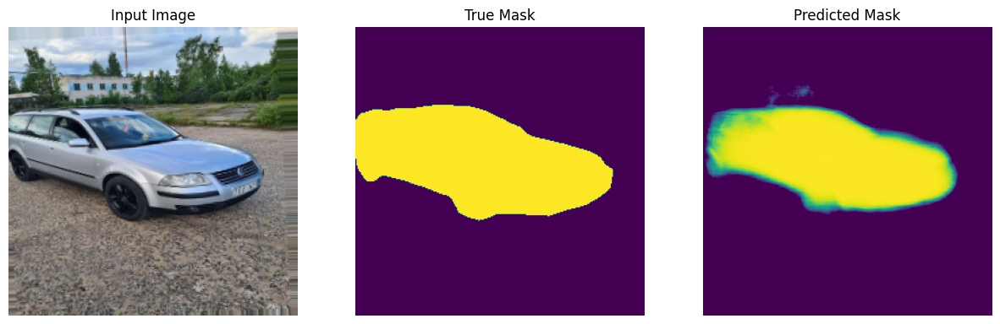


Sample Prediction after epoch 18

100/100 [==============================] - 52s 521ms/step - loss: 0.5043 - accuracy: 0.9347
Epoch 19/50
100/100 [==============================] - ETA: 0s - loss: 0.4989 - accuracy: 0.9347
Epoch 19: loss improved from 0.50334 to 0.49891, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


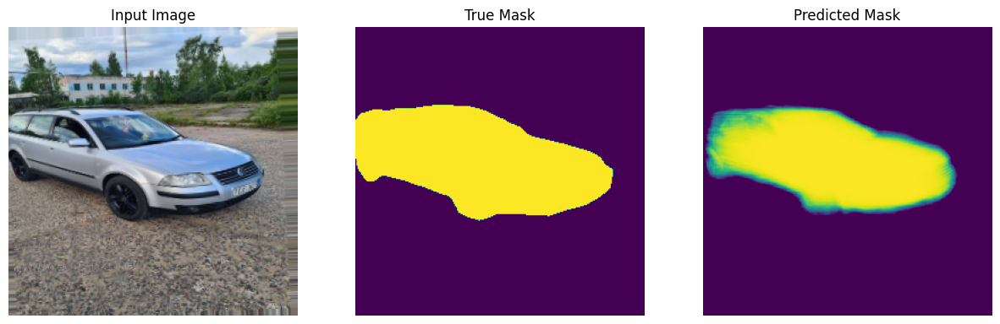


Sample Prediction after epoch 19

100/100 [==============================] - 58s 580ms/step - loss: 0.4989 - accuracy: 0.9347
Epoch 20/50
100/100 [==============================] - ETA: 0s - loss: 0.4923 - accuracy: 0.9398
Epoch 20: loss improved from 0.49891 to 0.49227, saving model to unet_car.hdf5
1/1 [==============================] - 0s 32ms/step


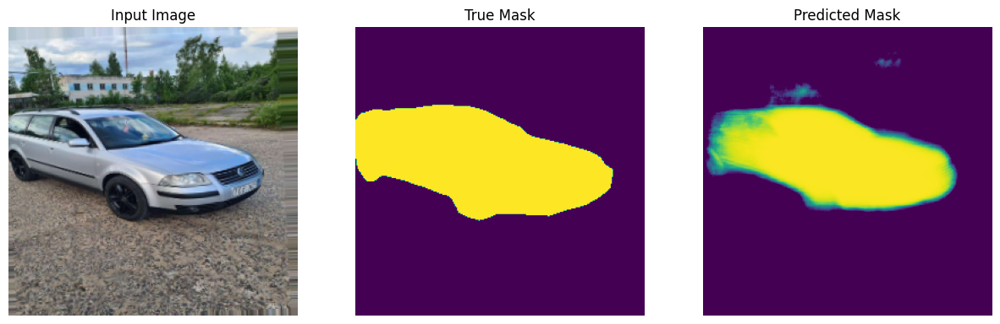


Sample Prediction after epoch 20

100/100 [==============================] - 59s 594ms/step - loss: 0.4923 - accuracy: 0.9398
Epoch 21/50
100/100 [==============================] - ETA: 0s - loss: 0.4980 - accuracy: 0.9406
Epoch 21: loss did not improve from 0.49227
1/1 [==============================] - 0s 33ms/step


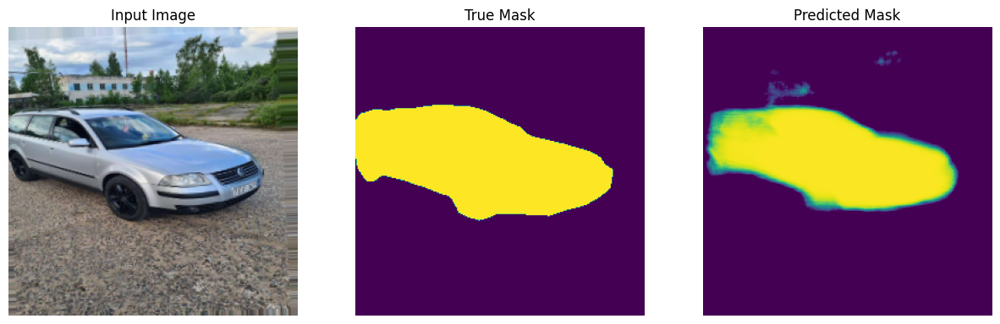


Sample Prediction after epoch 21

100/100 [==============================] - 54s 538ms/step - loss: 0.4980 - accuracy: 0.9406
Epoch 22/50
100/100 [==============================] - ETA: 0s - loss: 0.5017 - accuracy: 0.9334
Epoch 22: loss did not improve from 0.49227
1/1 [==============================] - 0s 29ms/step


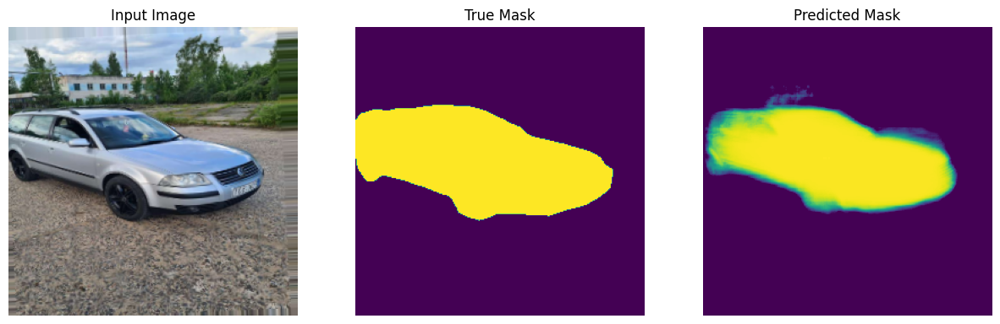


Sample Prediction after epoch 22

100/100 [==============================] - 55s 553ms/step - loss: 0.5017 - accuracy: 0.9334
Epoch 23/50
100/100 [==============================] - ETA: 0s - loss: 0.4945 - accuracy: 0.9382
Epoch 23: loss did not improve from 0.49227
1/1 [==============================] - 0s 36ms/step


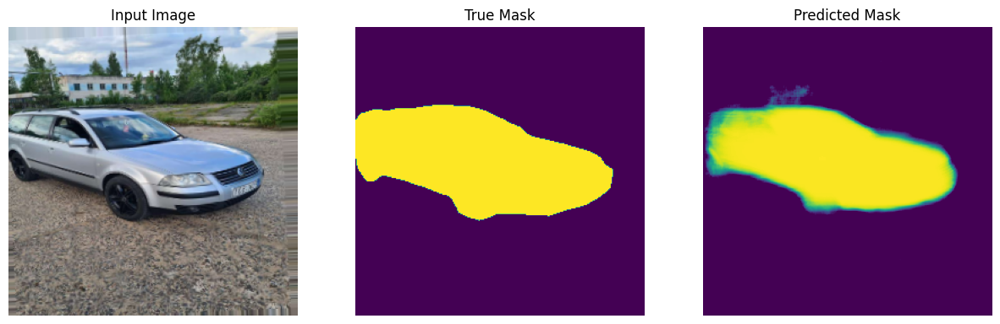


Sample Prediction after epoch 23

100/100 [==============================] - 60s 602ms/step - loss: 0.4945 - accuracy: 0.9382
Epoch 24/50
100/100 [==============================] - ETA: 0s - loss: 0.4883 - accuracy: 0.9469
Epoch 24: loss improved from 0.49227 to 0.48834, saving model to unet_car.hdf5
1/1 [==============================] - 0s 29ms/step


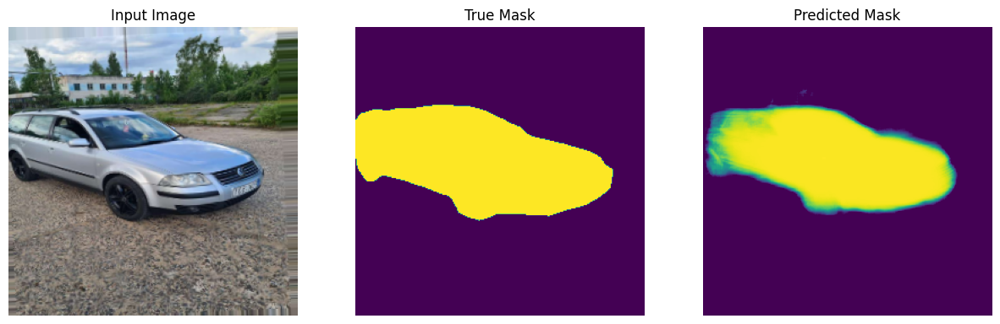


Sample Prediction after epoch 24

100/100 [==============================] - 63s 627ms/step - loss: 0.4883 - accuracy: 0.9469
Epoch 25/50
100/100 [==============================] - ETA: 0s - loss: 0.4810 - accuracy: 0.9449
Epoch 25: loss improved from 0.48834 to 0.48095, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


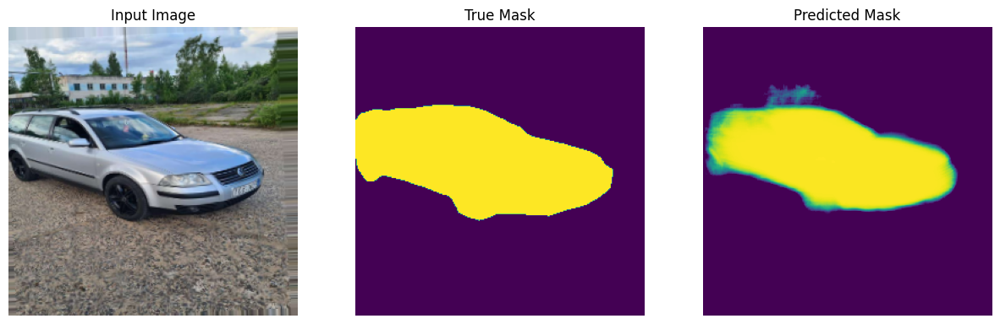


Sample Prediction after epoch 25

100/100 [==============================] - 57s 575ms/step - loss: 0.4810 - accuracy: 0.9449
Epoch 26/50
100/100 [==============================] - ETA: 0s - loss: 0.4916 - accuracy: 0.9494
Epoch 26: loss did not improve from 0.48095
1/1 [==============================] - 0s 29ms/step


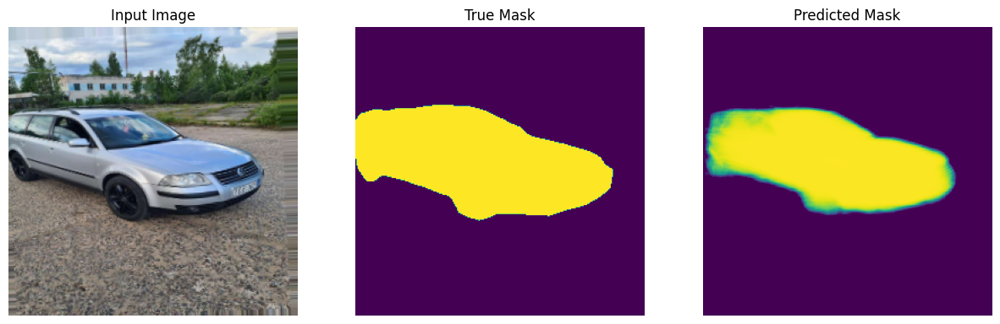


Sample Prediction after epoch 26

100/100 [==============================] - 53s 532ms/step - loss: 0.4916 - accuracy: 0.9494
Epoch 27/50
100/100 [==============================] - ETA: 0s - loss: 0.4777 - accuracy: 0.9418
Epoch 27: loss improved from 0.48095 to 0.47767, saving model to unet_car.hdf5
1/1 [==============================] - 0s 31ms/step


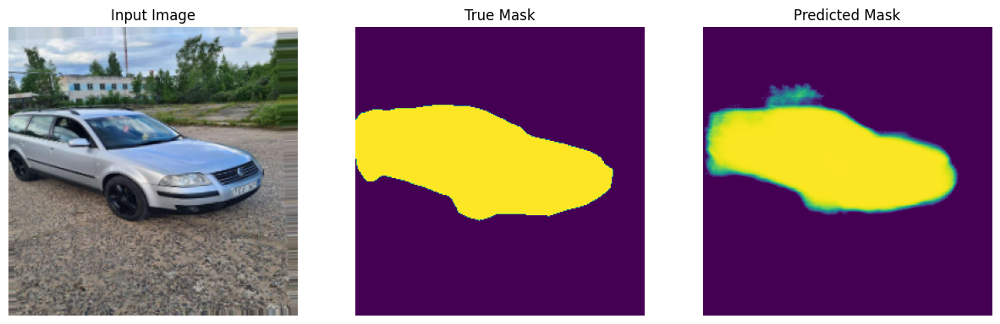


Sample Prediction after epoch 27

100/100 [==============================] - 62s 626ms/step - loss: 0.4777 - accuracy: 0.9418
Epoch 28/50
100/100 [==============================] - ETA: 0s - loss: 0.4811 - accuracy: 0.9515
Epoch 28: loss did not improve from 0.47767
1/1 [==============================] - 0s 40ms/step


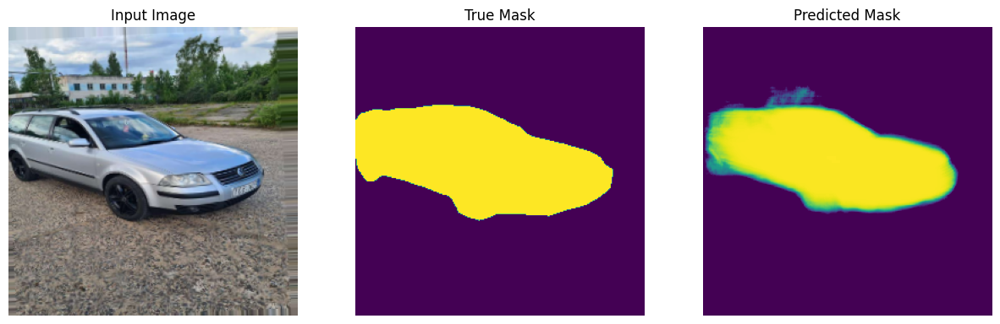


Sample Prediction after epoch 28

100/100 [==============================] - 56s 564ms/step - loss: 0.4811 - accuracy: 0.9515
Epoch 29/50
100/100 [==============================] - ETA: 0s - loss: 0.4731 - accuracy: 0.9505
Epoch 29: loss improved from 0.47767 to 0.47310, saving model to unet_car.hdf5
1/1 [==============================] - 0s 34ms/step


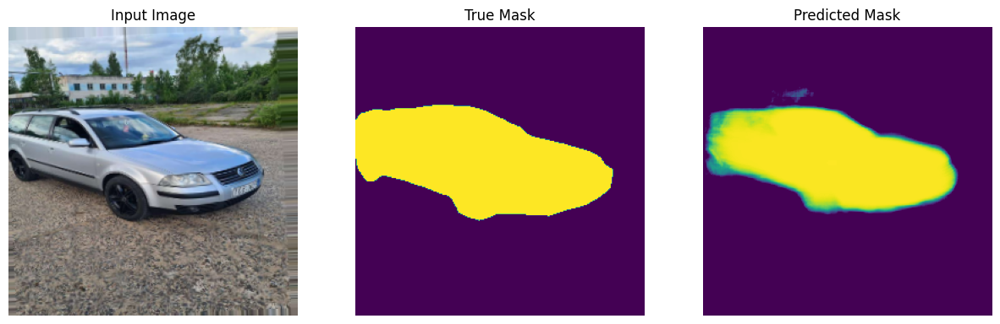


Sample Prediction after epoch 29

100/100 [==============================] - 63s 630ms/step - loss: 0.4731 - accuracy: 0.9505
Epoch 30/50
100/100 [==============================] - ETA: 0s - loss: 0.4751 - accuracy: 0.9552
Epoch 30: loss did not improve from 0.47310
1/1 [==============================] - 0s 28ms/step


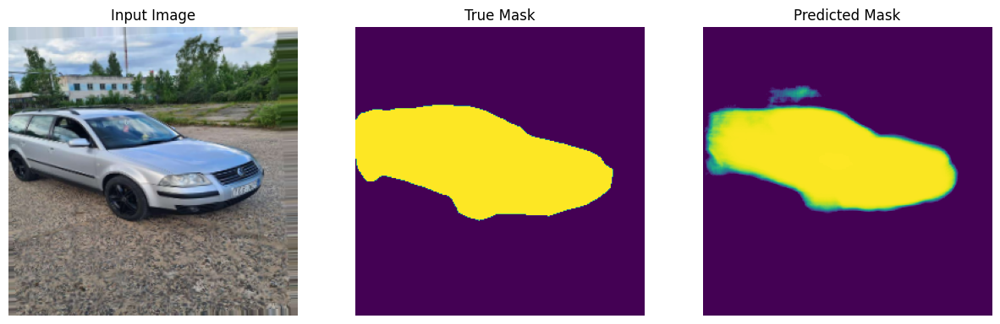


Sample Prediction after epoch 30

100/100 [==============================] - 56s 556ms/step - loss: 0.4751 - accuracy: 0.9552
Epoch 31/50
100/100 [==============================] - ETA: 0s - loss: 0.4728 - accuracy: 0.9506
Epoch 31: loss improved from 0.47310 to 0.47282, saving model to unet_car.hdf5
1/1 [==============================] - 0s 59ms/step


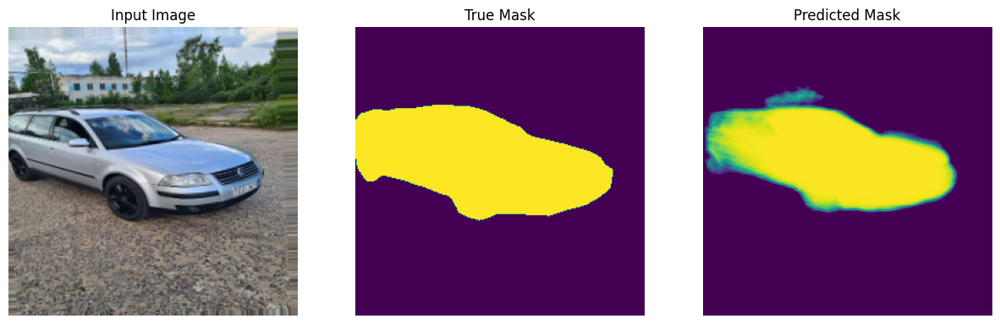


Sample Prediction after epoch 31

100/100 [==============================] - 62s 627ms/step - loss: 0.4728 - accuracy: 0.9506
Epoch 32/50
100/100 [==============================] - ETA: 0s - loss: 0.4759 - accuracy: 0.9470
Epoch 32: loss did not improve from 0.47282
1/1 [==============================] - 0s 31ms/step


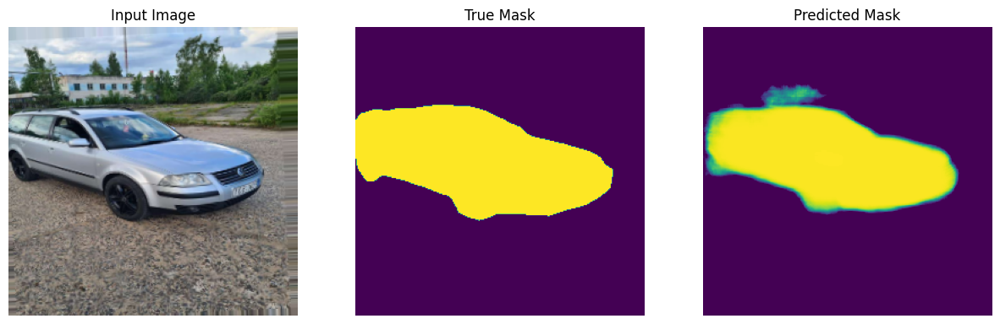


Sample Prediction after epoch 32

100/100 [==============================] - 57s 568ms/step - loss: 0.4759 - accuracy: 0.9470
Epoch 33/50
100/100 [==============================] - ETA: 0s - loss: 0.4791 - accuracy: 0.9518
Epoch 33: loss did not improve from 0.47282
1/1 [==============================] - 0s 29ms/step


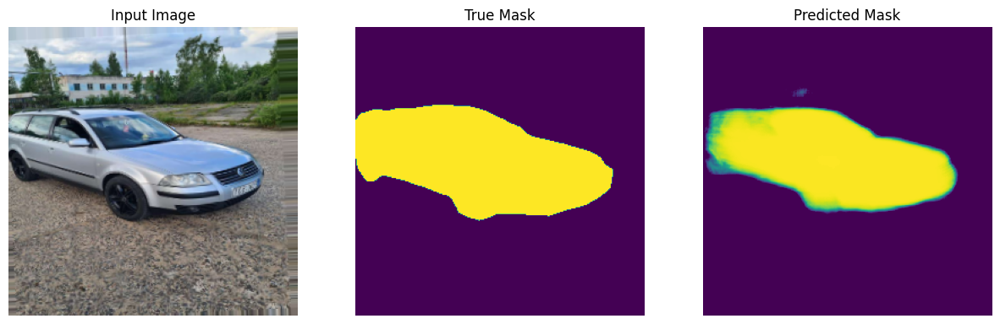


Sample Prediction after epoch 33

100/100 [==============================] - 58s 577ms/step - loss: 0.4791 - accuracy: 0.9518
Epoch 34/50
100/100 [==============================] - ETA: 0s - loss: 0.4721 - accuracy: 0.9543
Epoch 34: loss improved from 0.47282 to 0.47210, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


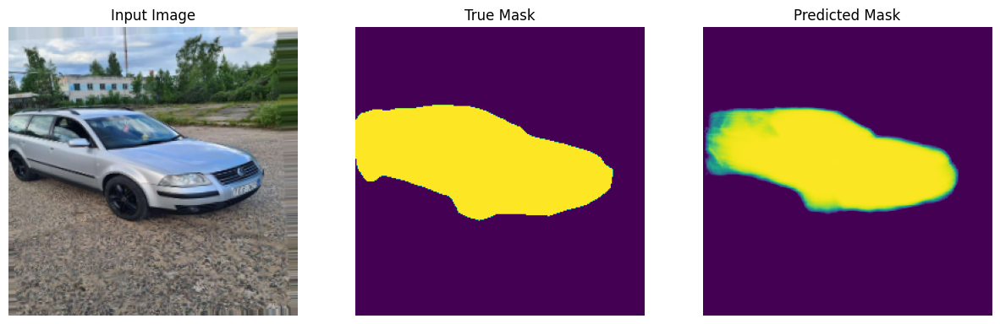


Sample Prediction after epoch 34

100/100 [==============================] - 58s 580ms/step - loss: 0.4721 - accuracy: 0.9543
Epoch 35/50
100/100 [==============================] - ETA: 0s - loss: 0.4659 - accuracy: 0.9589
Epoch 35: loss improved from 0.47210 to 0.46585, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


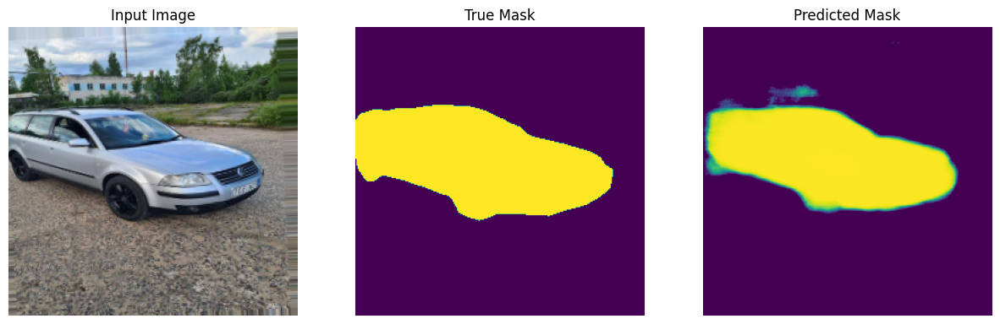


Sample Prediction after epoch 35

100/100 [==============================] - 59s 589ms/step - loss: 0.4659 - accuracy: 0.9589
Epoch 36/50
100/100 [==============================] - ETA: 0s - loss: 0.4671 - accuracy: 0.9598
Epoch 36: loss did not improve from 0.46585
1/1 [==============================] - 0s 29ms/step


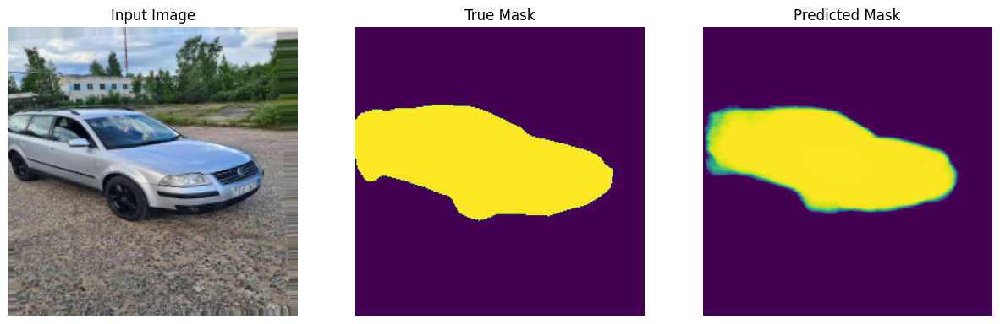


Sample Prediction after epoch 36

100/100 [==============================] - 55s 553ms/step - loss: 0.4671 - accuracy: 0.9598
Epoch 37/50
100/100 [==============================] - ETA: 0s - loss: 0.4665 - accuracy: 0.9576
Epoch 37: loss did not improve from 0.46585
1/1 [==============================] - 0s 32ms/step


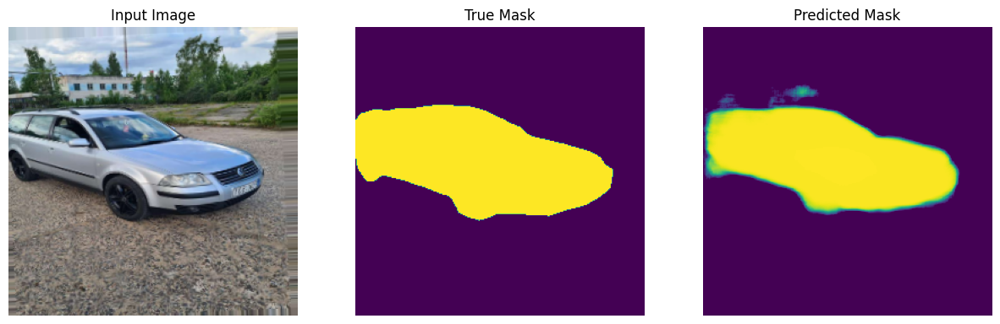


Sample Prediction after epoch 37

100/100 [==============================] - 59s 587ms/step - loss: 0.4665 - accuracy: 0.9576
Epoch 38/50
100/100 [==============================] - ETA: 0s - loss: 0.4693 - accuracy: 0.9622
Epoch 38: loss did not improve from 0.46585
1/1 [==============================] - 0s 42ms/step


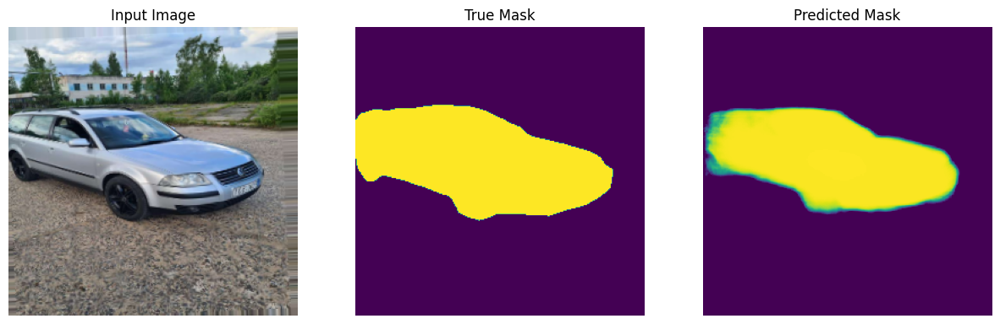


Sample Prediction after epoch 38

100/100 [==============================] - 58s 576ms/step - loss: 0.4693 - accuracy: 0.9622
Epoch 39/50
100/100 [==============================] - ETA: 0s - loss: 0.4671 - accuracy: 0.9642
Epoch 39: loss did not improve from 0.46585
1/1 [==============================] - 0s 28ms/step


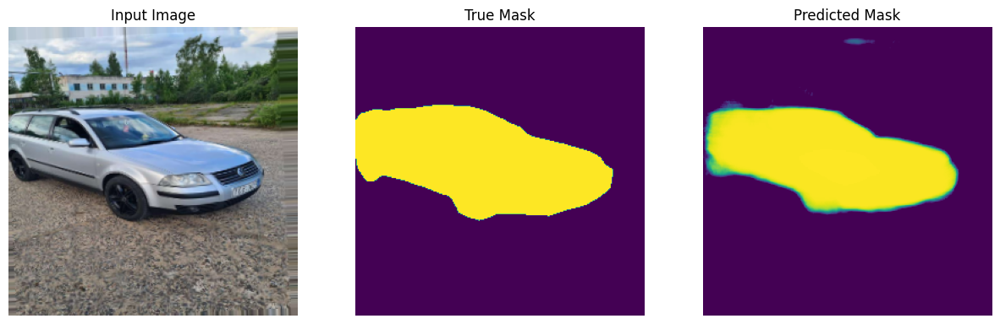


Sample Prediction after epoch 39

100/100 [==============================] - 61s 614ms/step - loss: 0.4671 - accuracy: 0.9642
Epoch 40/50
100/100 [==============================] - ETA: 0s - loss: 0.4625 - accuracy: 0.9531
Epoch 40: loss improved from 0.46585 to 0.46249, saving model to unet_car.hdf5
1/1 [==============================] - 0s 36ms/step


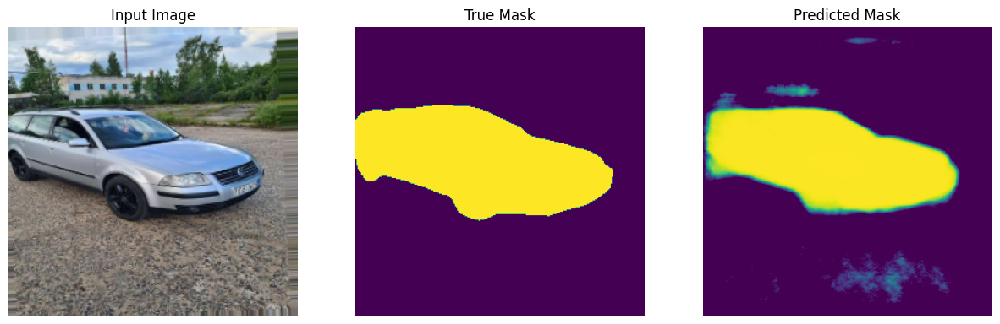


Sample Prediction after epoch 40

100/100 [==============================] - 64s 646ms/step - loss: 0.4625 - accuracy: 0.9531
Epoch 41/50
100/100 [==============================] - ETA: 0s - loss: 0.4742 - accuracy: 0.9566
Epoch 41: loss did not improve from 0.46249
1/1 [==============================] - 0s 36ms/step


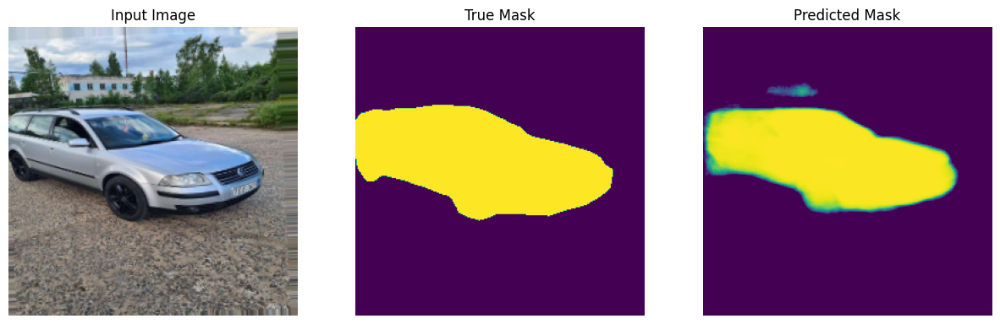


Sample Prediction after epoch 41

100/100 [==============================] - 57s 576ms/step - loss: 0.4742 - accuracy: 0.9566
Epoch 42/50
100/100 [==============================] - ETA: 0s - loss: 0.4584 - accuracy: 0.9602
Epoch 42: loss improved from 0.46249 to 0.45839, saving model to unet_car.hdf5
1/1 [==============================] - 0s 30ms/step


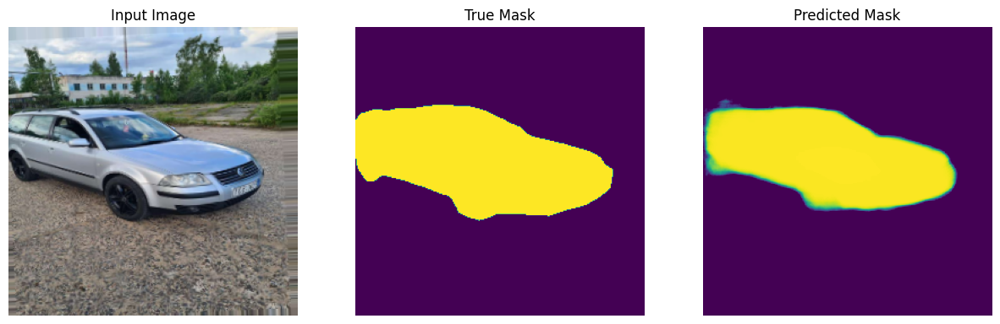


Sample Prediction after epoch 42

100/100 [==============================] - 61s 613ms/step - loss: 0.4584 - accuracy: 0.9602
Epoch 43/50
100/100 [==============================] - ETA: 0s - loss: 0.4588 - accuracy: 0.9686
Epoch 43: loss did not improve from 0.45839
1/1 [==============================] - 0s 36ms/step


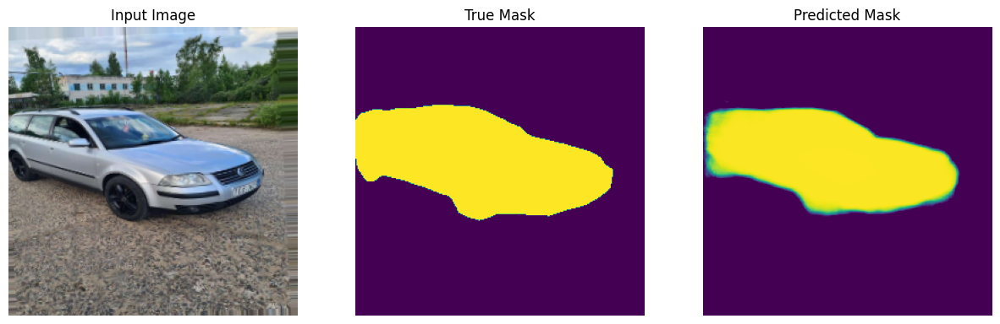


Sample Prediction after epoch 43

100/100 [==============================] - 56s 560ms/step - loss: 0.4588 - accuracy: 0.9686
Epoch 44/50
100/100 [==============================] - ETA: 0s - loss: 0.4638 - accuracy: 0.9681
Epoch 44: loss did not improve from 0.45839
1/1 [==============================] - 0s 33ms/step


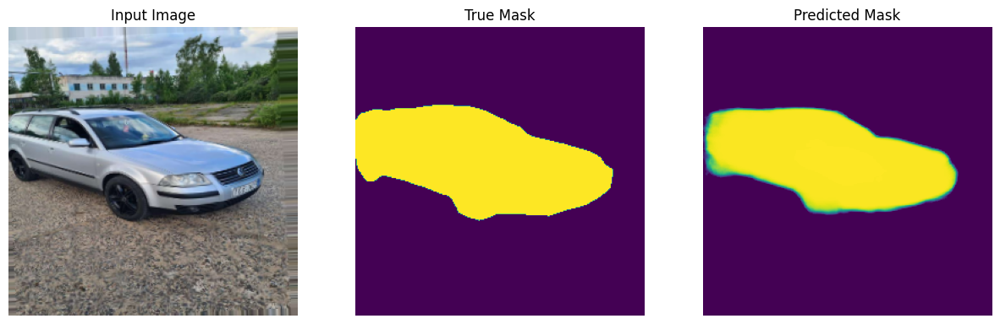


Sample Prediction after epoch 44

100/100 [==============================] - 60s 601ms/step - loss: 0.4638 - accuracy: 0.9681
Epoch 45/50
100/100 [==============================] - ETA: 0s - loss: 0.4502 - accuracy: 0.9662
Epoch 45: loss improved from 0.45839 to 0.45022, saving model to unet_car.hdf5
1/1 [==============================] - 0s 31ms/step


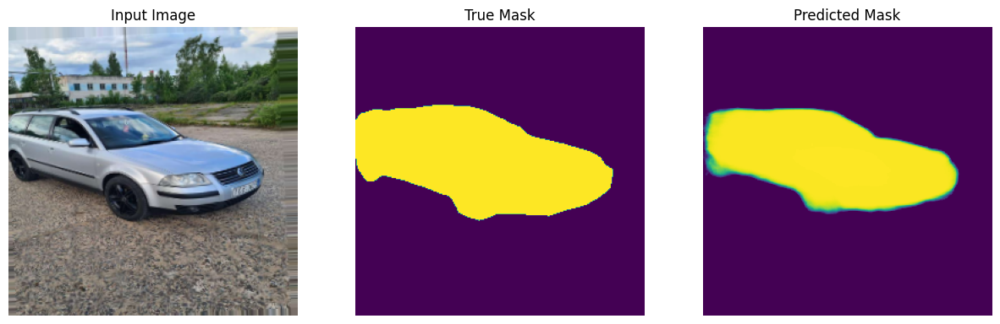


Sample Prediction after epoch 45

100/100 [==============================] - 68s 677ms/step - loss: 0.4502 - accuracy: 0.9662
Epoch 46/50
100/100 [==============================] - ETA: 0s - loss: 0.4507 - accuracy: 0.9678
Epoch 46: loss did not improve from 0.45022
1/1 [==============================] - 0s 37ms/step


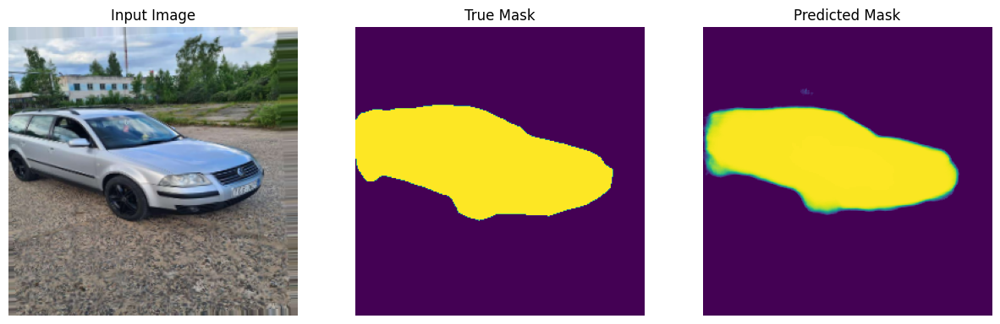


Sample Prediction after epoch 46

100/100 [==============================] - 56s 564ms/step - loss: 0.4507 - accuracy: 0.9678
Epoch 47/50
100/100 [==============================] - ETA: 0s - loss: 0.4530 - accuracy: 0.9677
Epoch 47: loss did not improve from 0.45022
1/1 [==============================] - 0s 38ms/step


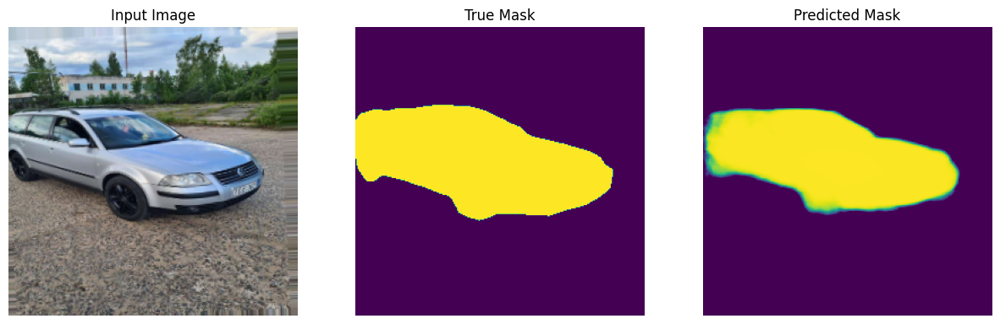


Sample Prediction after epoch 47

100/100 [==============================] - 59s 594ms/step - loss: 0.4530 - accuracy: 0.9677
Epoch 48/50
100/100 [==============================] - ETA: 0s - loss: 0.4590 - accuracy: 0.9590
Epoch 48: loss did not improve from 0.45022
1/1 [==============================] - 0s 44ms/step


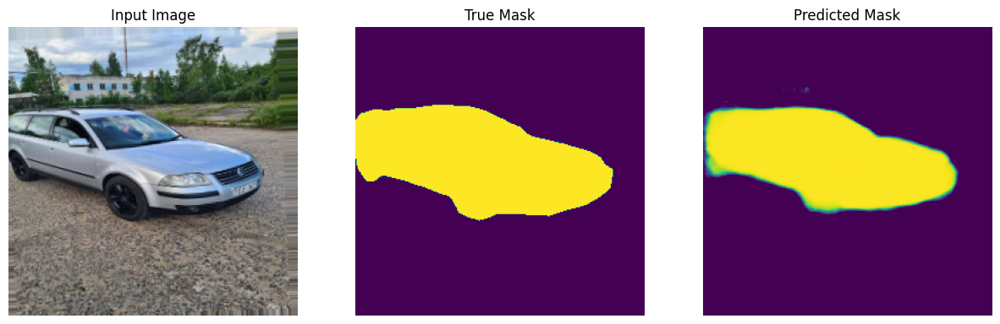


Sample Prediction after epoch 48

100/100 [==============================] - 58s 580ms/step - loss: 0.4590 - accuracy: 0.9590
Epoch 49/50
100/100 [==============================] - ETA: 0s - loss: 0.4558 - accuracy: 0.9672
Epoch 49: loss did not improve from 0.45022
1/1 [==============================] - 0s 36ms/step


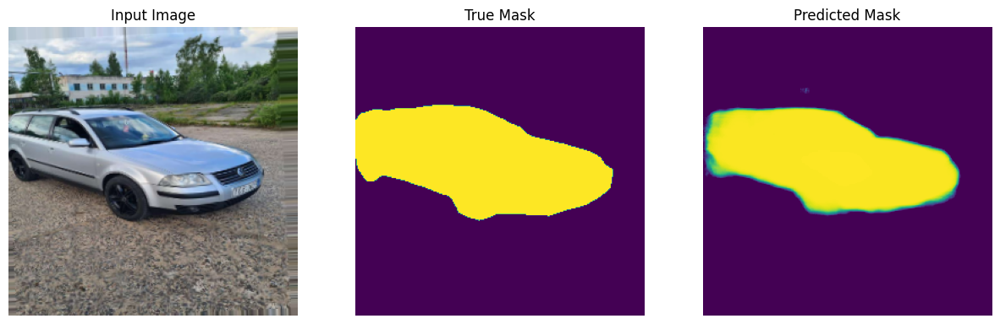


Sample Prediction after epoch 49

100/100 [==============================] - 60s 601ms/step - loss: 0.4558 - accuracy: 0.9672
Epoch 50/50
100/100 [==============================] - ETA: 0s - loss: 0.4490 - accuracy: 0.9674
Epoch 50: loss improved from 0.45022 to 0.44900, saving model to unet_car.hdf5
1/1 [==============================] - 0s 28ms/step


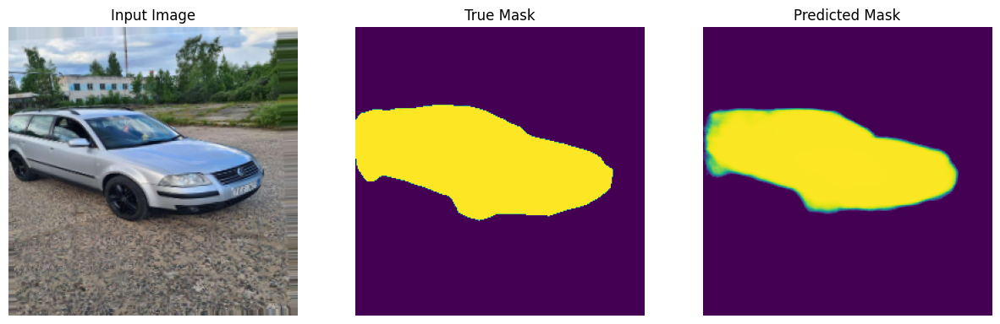


Sample Prediction after epoch 50

100/100 [==============================] - 63s 629ms/step - loss: 0.4490 - accuracy: 0.9674


In [12]:
model_checkpoint = ModelCheckpoint('unet_car.hdf5', monitor='loss',verbose=1, save_best_only=True)
print("Starting to fit UNET model..")
model.fit(train_data, steps_per_epoch=100, shuffle=True, batch_size=2, epochs=50, verbose=1,  callbacks=[model_checkpoint, DisplayCallback()])

1/1 [==============================] - 0s 22ms/step


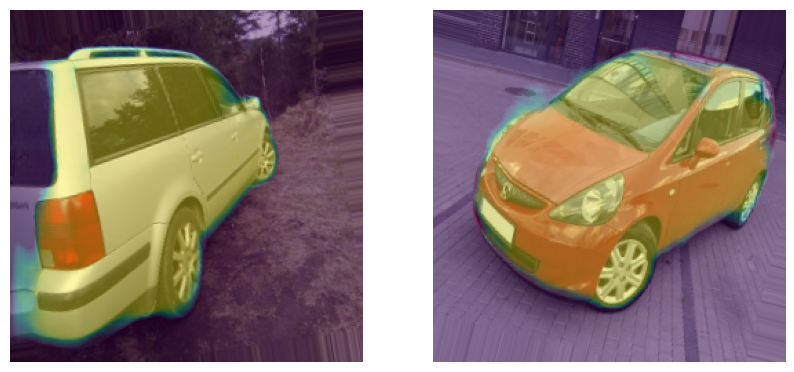

In [55]:
images, labels = next(train_data)
fig = plt.figure(figsize=(10,10))
mask = model.predict(images)
for i in range(2):
    fig.add_subplot(1, 2, i+1)
    plt.imshow(images[i])
    plt.imshow(mask[i], alpha=0.4)

    plt.axis(False)
plt.show()

In [56]:
# Save the entire model as a SavedModel.
!mkdir -p saved_model
model.save('saved_model/my_model')

INFO:tensorflow:Assets written to: saved_model/my_model\assets


INFO:tensorflow:Assets written to: saved_model/my_model\assets


In [57]:
model.save('unet.h5')